In [1]:
using Distributions: Gamma, Distribution, Beta, pdf, Normal, Bernoulli
using Statistics, LaTeXStrings, Plots
pyplot()

Plots.PyPlotBackend()

# Bayesian Inference

Bayesian statistics is a beautiful method of statistical inference, which allows experimenters/analysts to combine a prior belief with evidence. It is the conventional way of making rational decision in partial observability scenarios, even though our brains are actually very bad at doing it naturally _(See chapter 16 of the book "Thinking Fast and Slow" - D.Kahneman)_

This notebook should serve a simple introduction to Bayesian inference, with examples and animations to see exactly how this update mechanism works. There is another notebook explaining and implementing the Metropolis Hastings algorithm, which follows on from this notebook.

## Bayes Rule

We must start of with the pillar of Bayesian inferece: Bayes rule. We are given evidence/observations in the form of datapoints, $\boldsymbol{X}$, and we have a model (i.e. probability distribution) for the likelihood of an observation given a parameter $\theta$, written as $P(\boldsymbol{X}|\theta)$.


Furthermore, we have a prior belief over the parameter; maybe it's because we know it must lie in a specific interval, maybe it's because we're expert and know that this $\theta$ parameter must take a known form. Whatever the origin of our beliefs are, we can encode them in the prior, $P(\theta)$.

What we are looking for in the end is $\theta$, and Bayes rule allows us to find a probability distribution of $\theta$ given the evidence. This distribution then allows us to do a maximum-a-posteriori estimation if we want a single solution, but we also get a lot of extra information for free. This can take the form of uncertainty in the parameter interval, the presence of multiple nodes, or other properties of interest.

Bayes rule is

$$ P(\theta | \boldsymbol{X}) = \frac{P(\boldsymbol{X} | \theta) P(\theta)}{P(\boldsymbol{X})} $$ 

## Theoretical Example

To make a more practical study case, I'll borrow an example from Kahneman's book. Suppose you're given this description of Steve: "Steve is very shy and withdrawn. invariably helpful but with very little interest in people or in the world of reality. A meek and tidy soul, he has a need for order and structure, and a passion for detail".

Is Steve more likely to be a farmer, or a librarian?

You'd probably reply that Steve is more likely to be a librarian, out of instinct (people generally do). Let us take a Bayesian approach. In this case, the evidence comes in the form of personality traits: shy, organised, tidy, helpful. The $\theta$ parameter represents the job, farmer or librarian. 

If you were to take a maximum-likelihood approach, you'd probably determine that Steve is a librarian. Instead, taking a Bayesian approach, we have to add a prior. A prior in this case would simply be a ratio between the number of farmers and the number of librarians. A quick google search lead me to these two figures: In the UK, there are $\approx 19'000$ librarians, and $\approx 167'000$. Therefore our prior should be 

$$ P(librarian) = 0.11 \quad \quad P(farmer) = 0.89$$

To properly find a posterior for Steve's profession, we'd need to specify a (quantitative) likelihood function. However, it is clear our instinct did not fully consider this prior aspect, and we'd therefore give a much too high estimation of the probability of Steve being a librarian. 

## Practical example

Suppose we are at a Casino, and want to play a luck-based game, with two simple outcomes: win or lose, in which if we win, we get three times the amount of money bet. We can model this is a Binomial distribution, with success probability $p$. 

We observe a few players to gather evidence for our calculations, and we notice that out of **10 games, the players won 5 times**.

Let us first do a non-Bayesian approach to compare. A typical alternative is a maximum likelihood, whereas we find the probability rate $p$ that best fits our data.

_Reminder:_
$$ Binomial(p,n,k) = {n\choose k} \, p^k (1-p)^{n-k} $$
where _p_ is the succes probability, _n_ is the number of attempts, and _k_ the number of successes

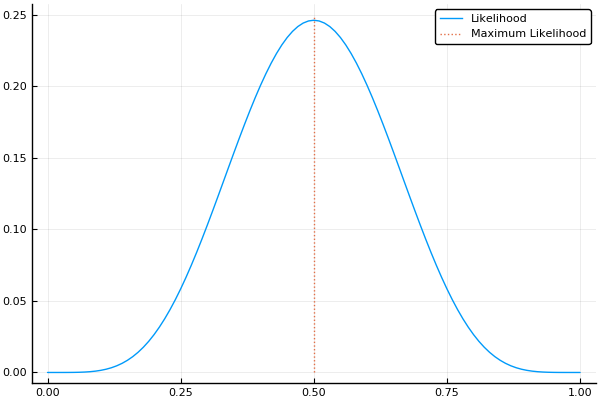

In [2]:
# Maximum likelihood

n,k = 10,5
discretised_p = collect(0.00:0.01:1.0)


ind_max = argmax( [p^k * (1-p)^(n-k) for p in discretised_p] )
maximum_lh = discretised_p[ind_max]

plot(discretised_p, [binomial(n,k) * p^k * (1-p)^(n-k) for p in discretised_p], label="Likelihood")
plot!([maximum_lh, maximum_lh], [0,0.25], style=:dot, label="Maximum Likelihood")

Now you might realise there's something strange: if the game actually had $p=0.5$, the casino would be losing a lot of money, since the player gets $3\times$ the bet value. In fact, given a constant bet of $1$, the expected win from the player is $3\cdot 0.5 \cdot n = 1.5 \cdot n$.

Therefore, we must re-adjust our belief. Welcome to the world of Bayesian statistics.

In this case, we can use the casino's policy as our prior. We know casinos are not charities, and are expecting to overall win. If they give a $3$ to $1$ bet winning, we can therefore assume the real expected probability is lower than that, but suppose we don't want to be biased toward an evil representation of casinos, then we can simply set our prior belief to be that the player is expected to win one in three times, that is $p=0.333..$

We can then use Bayes rule to update our posterior by taking advantage of the fact that the beta distribution is a conjugate prior of the Bernoulli distribution.

The posterior given a Bernoulli likelihood and beta prior is a beta distribution with

$$ \alpha' = \alpha + \sum x_i $$
$$ \beta' = \beta + n - \sum x_i $$

To set $\alpha$ and $\beta$ in the prior, we just need to notice the similarity between Bernoulli and beta distribution for a single try:

$$ Binomial(p,n,k) = {n\choose k}p^k (1-p)^{n-k} $$  
$$ Beta(\alpha, \beta) = x^{\alpha-1}(1-x)^{\beta-1} $$

The connection between $\alpha, \beta$ and $k$ is clear: $\alpha-1 = k$, $\beta-1=n-k$ 

Since we don't want a very strong prior, we can simply use what we would have expected to have: $k=3, n=10$
Then $\alpha = 4, \beta = 8$, which gives us the prior:

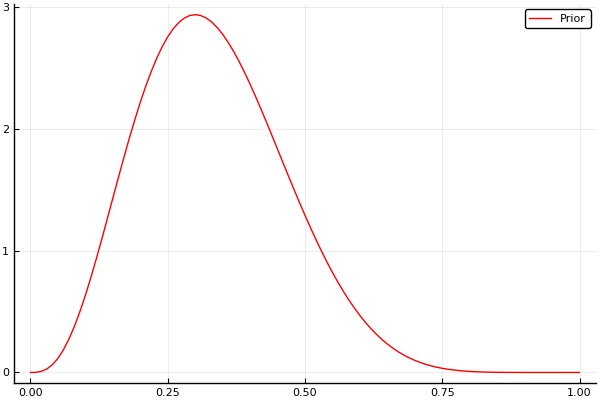

In [3]:
α, β = 4,8
plot( discretised_p, pdf.(Beta(α,β), discretised_p), label="Prior", color=:red)

Looks about right!

Now let us see what happens given our evidence of 7 wins out of 10:

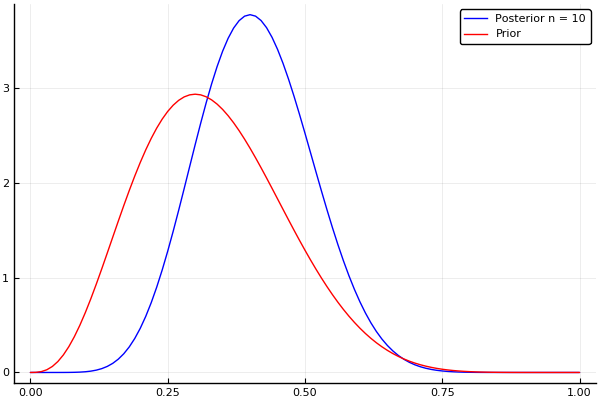

In [4]:
n, k = 10,5
α⁻ = α + k
β⁻ = β + n-k
plot( discretised_p, pdf.(Beta(α⁻,β⁻), discretised_p), label="Posterior n = 10", color=:blue )
plot!( discretised_p, pdf.(Beta(α,β), discretised_p), label="Prior", color=:red )

We can see the posterior has moved from the prior to adjust to the evidence.

Now let us suppose that we stay and look at more games, and now the win rate drops, and out of $10$ more games, the players only won $2$, giving us a total of $k=7, n=20$

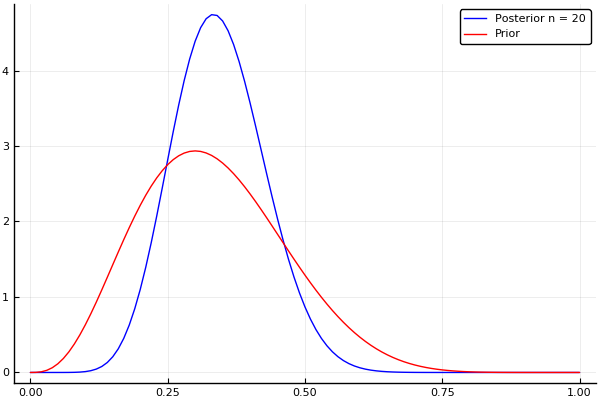

In [5]:
n,k = 20,7
α⁻ = α + k
β⁻ = β + n-k
plot( discretised_p, pdf.(Beta(α⁻,β⁻), discretised_p), label="Posterior n = $n", color=:blue )
plot!( discretised_p, pdf.(Beta(α,β), discretised_p), label="Prior", color=:red)

Notice that as more evidence is added, the posterior also gets narrower: this is an effect of the law of large number, that is that the more evidence you have, the closer you should get to the mean. This law is implicitly encoded in Bayes rule, which is yet another reason for its greatness!

Suppose the casino tells us that actually the ground truth $p=0.2$ (gotta make a living too..). Let us see, by adding more observations given what we already have, what happens.

In [ ]:
# Current observations
n,k = 20, 7

# Add one by one Bernoulli trials
anim = @animate for i in 1:50
    n += 1
    k += rand(Bernoulli(0.2)) 
    
    α⁻ = α + k
    β⁻ = β + n-k
    
    fig = plot( discretised_p, pdf.(Beta(α⁻,β⁻), discretised_p), label="Posterior n = $n", color=:blue )
    plot!(fig, discretised_p, pdf.(Beta(α,β), discretised_p), label="Prior", color=:red)
    plot!(fig,  [0.2,0.2], [0,9.], style=:dot, label="Ground Truth")
    fig;
end

<img src="posterior_50.gif">

As we see, updates are slowly pushing the posterior toward $p=0.2$, and is getting narrower and narrower. Given we're updating it one by one, it also is slightly jittery since the close it gets to $0.2$, the more a few lucky wins will affect it.

If we now update it by tens, and go to 500 total observations:

In [ ]:
# Current observations
n,k = 20, 7

# Add one by one Bernoulli trials
anim = @animate for i in 1:48
    n += 10
    k += sum( rand(Bernoulli(0.2), 10) )
    
    α⁻ = α + k
    β⁻ = β + n-k
        
    plot( discretised_p, pdf.(Beta(α⁻,β⁻), discretised_p), label="Posterior n = $n", color=:blue )
    plot!( discretised_p, pdf.(Beta(α,β), discretised_p), label="Prior", color=:red)
    plot!( [0.2,0.2], [0,24], style=:dot, label="Ground Truth")
end

<img src="posterior_500.gif">